___
# Лабораторна робота №2 [ EDA and Supervised Learning ]
___

Виконала:
студентка III курсу
групи ДА-01
**Хмиз Єлизавета Русланівна**

## Зміст
* Імпорт модулів
* Завантаження даних
* Огляд даних
* Обробка типів змінних
* Дублікати та відсутні значення
* Розподіли
* Аутлаєри
* Аналіз кореляцій між змінними
* Реалізація класифікатора
* Результат

## Мета
Навчитись робити розвідку даних (Exploratory Data Analysis - EDA) та використовувати інструменти для моделювання при навчанні з вчителем (Supervised Learning).

## Завдання
1. Прочитати опис та викачати дані з Kaggle змагання https://www.kaggle.com/c/home-credit-default-risk/data. Опис колонок знаходиться у файлі HomeCredit_columns_description.csv.
2. Для лабораторної роботи достатньо працювати лише з таблицями “application_{train|test}.csv”. З’єднувати інші таблиці не потрібно.
3. Провести EDA на таблицях “application_{train|test}.csv”: про що ці дані, які розподіли колонок, скільки missing values, наскільки збалансовані дані, яким чином обробити missing values, чим відрізняються train/test, ...?
4. Побудувати класифікатор на основі проаналізованих даних. Дозволяється використати будь-який з відомих Вам методів (наприклад за допомогою https://scikit-learn.org/stable/supervised_learning.html). Для оцінки якості натренованої моделі використати train-val-split, тобто відкласти частину “application_train.csv” для валідації. Метрика - ROC_AUC.
5. Класифікувати дані з файла application_test.csv, записати результат в submission файл за прикладом “sample_submission.csv”. 
6. Залити submission файл на платформу в “Leaderboard”->“Late Submission”, отримати результат - оцінку, зробити знімок екрану і додати його до фінального ноутбука.

## Хід роботи

<br/>

---
### Імпорт модулів
---

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn.preprocessing import LabelEncoder
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score

In [2]:
plt.rcParams['axes.prop_cycle'] = plt.cycler(color=['lightcoral'])

<br/>

---
### Завантаження даних
---

In [3]:
data_train = pd.read_csv('application_train.csv')
data_test = pd.read_csv('application_test.csv')

<br/>

---
### Огляд даних
---

Визначимо розмір та виведемо 10 випадкових рядків кожного датасету:

#### TRAIN

In [4]:
data_train.shape

(307511, 122)

In [5]:
data_train.sample(10)

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
62731,172759,0,Cash loans,F,N,Y,0,90000.0,339241.5,12919.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
215278,349454,0,Cash loans,M,Y,Y,1,315000.0,708939.0,43501.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
156551,281464,0,Revolving loans,F,N,Y,0,180000.0,270000.0,13500.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,6.0
143414,266290,0,Cash loans,F,N,Y,0,279000.0,1762110.0,48586.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,2.0
246359,385108,0,Revolving loans,F,Y,N,0,135000.0,337500.0,16875.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,2.0
38098,144117,0,Cash loans,F,N,N,0,81000.0,315000.0,19269.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
156278,281154,0,Cash loans,F,N,Y,0,191250.0,1255680.0,45234.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
119913,239049,0,Cash loans,F,N,Y,1,202500.0,339241.5,16627.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,2.0
269178,411941,0,Cash loans,M,Y,Y,0,315000.0,545040.0,20547.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
241490,379640,0,Cash loans,F,Y,N,0,180000.0,225000.0,24232.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


<br/>

#### TEST

In [6]:
data_test.shape

(48744, 121)

In [7]:
data_test.sample(10)

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
37940,378044,Cash loans,F,Y,Y,1,144000.0,512995.5,36612.0,454500.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,4.0
22771,265521,Cash loans,F,N,Y,0,112500.0,296280.0,21690.0,225000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,2.0
17336,225689,Cash loans,F,Y,Y,0,135000.0,572292.0,21703.5,472500.0,...,0,0,0,0,0.0,0.0,0.0,0.0,2.0,2.0
6429,147086,Cash loans,M,Y,Y,0,315000.0,917073.0,96430.5,855000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,1.0,5.0
3011,121111,Cash loans,F,N,Y,0,90000.0,272520.0,16803.0,225000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
43995,420866,Cash loans,F,N,Y,0,157500.0,708939.0,36328.5,612000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
43201,414480,Cash loans,M,N,N,0,135000.0,547272.0,35104.5,495000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
35835,362221,Cash loans,M,Y,N,0,126000.0,247500.0,26118.0,247500.0,...,0,0,0,0,0.0,0.0,0.0,0.0,1.0,2.0
39099,388208,Cash loans,F,N,Y,0,202500.0,360000.0,18508.5,360000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,7.0
41611,405232,Cash loans,F,Y,Y,0,135000.0,450000.0,23008.5,450000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,2.0


<br/>

Кількість колонок у датасеті для тренування на 1 більша, ніж у датасеті для тестування. Встановимо цю колонку:

In [8]:
data_train_copy = data_train.copy()
data_train_copy.drop(columns=list(data_test.columns), inplace=True)
data_train_copy.sample(10)

,TARGET
165785,0
43854,0
266521,0
39083,0
259468,0
58392,0
25938,0
282285,0
162781,0
267984,0


<br/>

---
### Обробка типів змінних
---

Визначимо типи змінних датасетів:

#### TRAIN

In [9]:
data_train.dtypes

SK_ID_CURR                      int64
TARGET                          int64
NAME_CONTRACT_TYPE             object
CODE_GENDER                    object
FLAG_OWN_CAR                   object
                               ...   
AMT_REQ_CREDIT_BUREAU_DAY     float64
AMT_REQ_CREDIT_BUREAU_WEEK    float64
AMT_REQ_CREDIT_BUREAU_MON     float64
AMT_REQ_CREDIT_BUREAU_QRT     float64
AMT_REQ_CREDIT_BUREAU_YEAR    float64
Length: 122, dtype: object

<br/>

#### TEST

In [10]:
data_test.dtypes

SK_ID_CURR                      int64
NAME_CONTRACT_TYPE             object
CODE_GENDER                    object
FLAG_OWN_CAR                   object
FLAG_OWN_REALTY                object
                               ...   
AMT_REQ_CREDIT_BUREAU_DAY     float64
AMT_REQ_CREDIT_BUREAU_WEEK    float64
AMT_REQ_CREDIT_BUREAU_MON     float64
AMT_REQ_CREDIT_BUREAU_QRT     float64
AMT_REQ_CREDIT_BUREAU_YEAR    float64
Length: 121, dtype: object

<br/>

Встановимо числові і категоріальні фічі:

In [11]:
numerical_features = data_train.select_dtypes(include=['float64', 'int64']).columns
numerical_features

Index(['SK_ID_CURR', 'TARGET', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE',
       'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED',
       ...
       'FLAG_DOCUMENT_18', 'FLAG_DOCUMENT_19', 'FLAG_DOCUMENT_20',
       'FLAG_DOCUMENT_21', 'AMT_REQ_CREDIT_BUREAU_HOUR',
       'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK',
       'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT',
       'AMT_REQ_CREDIT_BUREAU_YEAR'],
      dtype='object', length=106)

In [12]:
categorical_features = data_train.select_dtypes(include=['object']).columns
categorical_features

Index(['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY',
       'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE',
       'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE',
       'WEEKDAY_APPR_PROCESS_START', 'ORGANIZATION_TYPE', 'FONDKAPREMONT_MODE',
       'HOUSETYPE_MODE', 'WALLSMATERIAL_MODE', 'EMERGENCYSTATE_MODE'],
      dtype='object')

<br/>

Як бачимо, значна частина фіч є категоріальними, їх важко аналізувати та обробляти, оскільки більшість алгоритмів машинного навчання розроблена для роботи з числовими даними. 

Закодуємо категоріальні змінні в числові значення. Цей процес передбачає перетворення кожного категоріального значення в унікальне число, яке можна безпосередньо порівняти чи впорядкувати. Для категоріальних  змінних з <= 2 унікальними категоріями використаємо label кодування, з більш ніж 2 унікальними категоріями – one-hot кодування:

In [13]:
le = LabelEncoder()

for col in data_train:
    if data_train[col].dtype == 'object':
        if len(list(data_train[col].unique())) <= 2:
            data_train[col] = le.fit_transform(data_train[col])
            data_test[col] = le.transform(data_test[col])

data_train = pd.get_dummies(data_train)
data_test = pd.get_dummies(data_test)

<br/>
Встановимо нові розміри датасетів:

#### TRAIN

In [14]:
data_train.shape

(307511, 243)

#### TEST

In [15]:
data_test.shape

(48744, 239)

<br/>

У результаті виконання one-hot кодування у train датасеті з’явилось на 3 стовпці більше, ніж у test датасеті, тому датасети необхідно зрівняти, видаливши стовпці з даних для навчання, яких немає в даних для тестування:

In [16]:
target = data_train['TARGET']
data_train, data_test = data_train.align(data_test, join = 'inner', axis = 1)
data_train['TARGET'] = target

<br/>
Подивимось розміри датасетів:

#### TRAIN

In [17]:
data_train.shape

(307511, 240)

#### TEST

In [18]:
data_test.shape

(48744, 239)

<br/>

---
### Дублікати та відсутні значення
---

Щоб уникнути потенційних упереджень або помилок у результатах і забезпечити проведення аналізу на основі повних і точних даних, виявимо дубікати або відсутні значення та виконаємо обробку, якщо такі наявні.

Визначимо, чи наявні дублікати в датасетах:

#### TRAIN

In [19]:
data_train.duplicated().sum()

0

#### TEST

In [20]:
data_test.duplicated().sum()

0

Дублікати в обох датасетах відсутні.

<br/>

Реалізуємо функцію визначення відсотку відсутніх значень у кожному стовпці у спадаючому порядку:

In [21]:
def missing_values_info(data):
    res = pd.DataFrame((data.isnull().sum() / data.shape[0] * 100).sort_values(ascending=False))
    res.columns = ['PERCENT_OF_MISSING_VALUES']
    return res

Встановимо, чи наявні відсутні значення і якщо так, виведемо їх відсоток у кожному стовпці:

#### TRAIN

In [22]:
missing_values_info(data_train)

,PERCENT_OF_MISSING_VALUES
COMMONAREA_AVG,69.872297
COMMONAREA_MODE,69.872297
COMMONAREA_MEDI,69.872297
NONLIVINGAPARTMENTS_AVG,69.432963
NONLIVINGAPARTMENTS_MEDI,69.432963
...,...
NAME_INCOME_TYPE_Unemployed,0.000000
NAME_INCOME_TYPE_Working,0.000000
NAME_EDUCATION_TYPE_Academic degree,0.000000
NAME_EDUCATION_TYPE_Higher education,0.000000


#### TEST

In [23]:
missing_values_info(data_test)

,PERCENT_OF_MISSING_VALUES
COMMONAREA_AVG,68.716150
COMMONAREA_MEDI,68.716150
COMMONAREA_MODE,68.716150
NONLIVINGAPARTMENTS_MEDI,68.412523
NONLIVINGAPARTMENTS_MODE,68.412523
...,...
NAME_INCOME_TYPE_State servant,0.000000
NAME_INCOME_TYPE_Student,0.000000
NAME_INCOME_TYPE_Unemployed,0.000000
NAME_INCOME_TYPE_Working,0.000000


<br/>
Виходячи з отриманих результатів, можна сказати, що відсутніх значень багато, в деяких стовпцях їх кількість сягає 69%. Видалення стовпців або(і) рядків із пропущеними значеннями в цьому випадку може призвести до значної втрати важливих даних. Тому було прийнято рішення заповнити відсутні значення, використовуючи імпутацію середнього значення:

In [24]:
target = data_train['TARGET']
data_train = data_train.drop(columns = ['TARGET'])

imputer = SimpleImputer(strategy = 'mean')
data_train = pd.DataFrame(imputer.fit_transform(data_train), columns = data_train.columns)
data_test = pd.DataFrame(imputer.transform(data_test), columns = data_test.columns)

data_train['TARGET'] = target

<br/>

Переконаємося, що відсутні значення заповнено:

#### TRAIN

In [25]:
missing_values_info(data_train)

,PERCENT_OF_MISSING_VALUES
SK_ID_CURR,0.0
NAME_CONTRACT_TYPE,0.0
OCCUPATION_TYPE_Private service staff,0.0
OCCUPATION_TYPE_Realty agents,0.0
OCCUPATION_TYPE_Sales staff,0.0
...,...
FLAG_DOCUMENT_4,0.0
FLAG_DOCUMENT_5,0.0
FLAG_DOCUMENT_6,0.0
FLAG_DOCUMENT_7,0.0


#### TEST

In [26]:
missing_values_info(data_test)

,PERCENT_OF_MISSING_VALUES
SK_ID_CURR,0.0
WEEKDAY_APPR_PROCESS_START_WEDNESDAY,0.0
OCCUPATION_TYPE_Private service staff,0.0
OCCUPATION_TYPE_Realty agents,0.0
OCCUPATION_TYPE_Sales staff,0.0
...,...
FLAG_DOCUMENT_4,0.0
FLAG_DOCUMENT_5,0.0
FLAG_DOCUMENT_6,0.0
FLAG_DOCUMENT_7,0.0


<br/>

---
### Розподіли
---

Визначимо статистики всіх колонок:

#### TRAIN

In [27]:
data_train.describe(include="all")

,SK_ID_CURR,NAME_CONTRACT_TYPE,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,...,WALLSMATERIAL_MODE_Block,WALLSMATERIAL_MODE_Mixed,WALLSMATERIAL_MODE_Monolithic,WALLSMATERIAL_MODE_Others,WALLSMATERIAL_MODE_Panel,"WALLSMATERIAL_MODE_Stone, brick",WALLSMATERIAL_MODE_Wooden,EMERGENCYSTATE_MODE_No,EMERGENCYSTATE_MODE_Yes,TARGET
count,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,3.075110e+05,3.075110e+05,307511.000000,3.075110e+05,307511.000000,...,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000
mean,278180.518577,0.095213,0.340108,0.693673,0.417052,1.687979e+05,5.990260e+05,27108.573909,5.383962e+05,0.020868,...,0.030090,0.007466,0.005785,0.005284,0.214757,0.210773,0.017437,0.518446,0.007570,0.080729
std,102790.175348,0.293509,0.473746,0.460968,0.722121,2.371231e+05,4.024908e+05,14493.454517,3.692794e+05,0.013831,...,0.170835,0.086085,0.075840,0.072501,0.410654,0.407858,0.130892,0.499660,0.086679,0.272419
min,100002.000000,0.000000,0.000000,0.000000,0.000000,2.565000e+04,4.500000e+04,1615.500000,4.050000e+04,0.000290,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,189145.500000,0.000000,0.000000,0.000000,0.000000,1.125000e+05,2.700000e+05,16524.000000,2.385000e+05,0.010006,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,278202.000000,0.000000,0.000000,1.000000,0.000000,1.471500e+05,5.135310e+05,24903.000000,4.500000e+05,0.018850,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000
75%,367142.500000,0.000000,1.000000,1.000000,1.000000,2.025000e+05,8.086500e+05,34596.000000,6.795000e+05,0.028663,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000
max,456255.000000,1.000000,1.000000,1.000000,19.000000,1.170000e+08,4.050000e+06,258025.500000,4.050000e+06,0.072508,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


#### TEST

In [28]:
data_test.describe(include="all")

,SK_ID_CURR,NAME_CONTRACT_TYPE,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,...,HOUSETYPE_MODE_terraced house,WALLSMATERIAL_MODE_Block,WALLSMATERIAL_MODE_Mixed,WALLSMATERIAL_MODE_Monolithic,WALLSMATERIAL_MODE_Others,WALLSMATERIAL_MODE_Panel,"WALLSMATERIAL_MODE_Stone, brick",WALLSMATERIAL_MODE_Wooden,EMERGENCYSTATE_MODE_No,EMERGENCYSTATE_MODE_Yes
count,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,4.874400e+04,4.874400e+04,48744.000000,4.874400e+04,48744.000000,...,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000
mean,277796.676350,0.009006,0.337129,0.690505,0.397054,1.784318e+05,5.167404e+05,29425.099064,4.626188e+05,0.021226,...,0.004185,0.029296,0.007242,0.005929,0.005826,0.231187,0.214057,0.016289,0.537071,0.007303
std,103169.547296,0.094474,0.472734,0.462290,0.709047,1.015226e+05,3.653970e+05,16012.507319,3.367102e+05,0.014428,...,0.064558,0.168636,0.084792,0.076772,0.076109,0.421596,0.410171,0.126587,0.498629,0.085149
min,100001.000000,0.000000,0.000000,0.000000,0.000000,2.694150e+04,4.500000e+04,2295.000000,4.500000e+04,0.000253,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,188557.750000,0.000000,0.000000,0.000000,0.000000,1.125000e+05,2.606400e+05,17973.000000,2.250000e+05,0.010006,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,277549.000000,0.000000,0.000000,1.000000,0.000000,1.575000e+05,4.500000e+05,26221.500000,3.960000e+05,0.018850,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000
75%,367555.500000,0.000000,1.000000,1.000000,1.000000,2.250000e+05,6.750000e+05,37390.500000,6.300000e+05,0.028663,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000
max,456250.000000,1.000000,1.000000,1.000000,20.000000,4.410000e+06,2.245500e+06,180576.000000,2.245500e+06,0.072508,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


<br/>

Особливу увагу звернемо на залежну змінну TARGET в train датасеті. Отримаємо кількість значень кожної категорії стовпця TARGET:

In [29]:
data_train['TARGET'].value_counts()

0    282686
1     24825
Name: TARGET, dtype: int64

<br/>
Виходячи з результату, можна сказати, що дані незбалансовані. Переконаємося в цьому побудувавши графік:

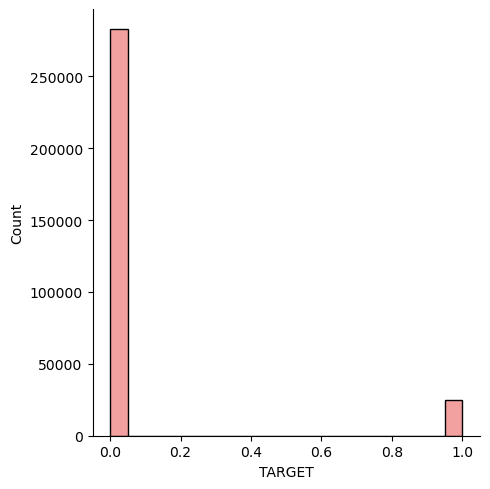

In [30]:
sns.displot(data_train['TARGET'])

<br/>

Переглянемо розподіли фіч в датасетах:

#### TRAIN

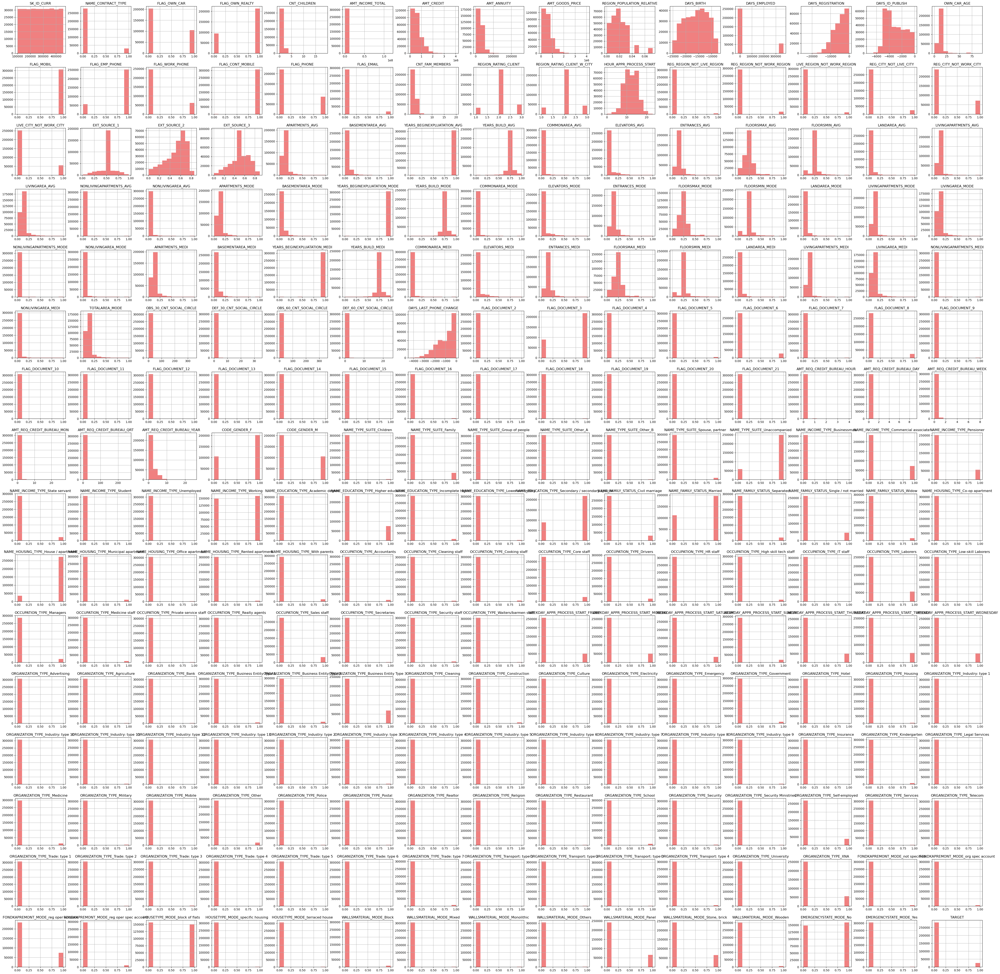

In [31]:
data_train.hist(figsize=(60,60))
plt.show()

#### TEST

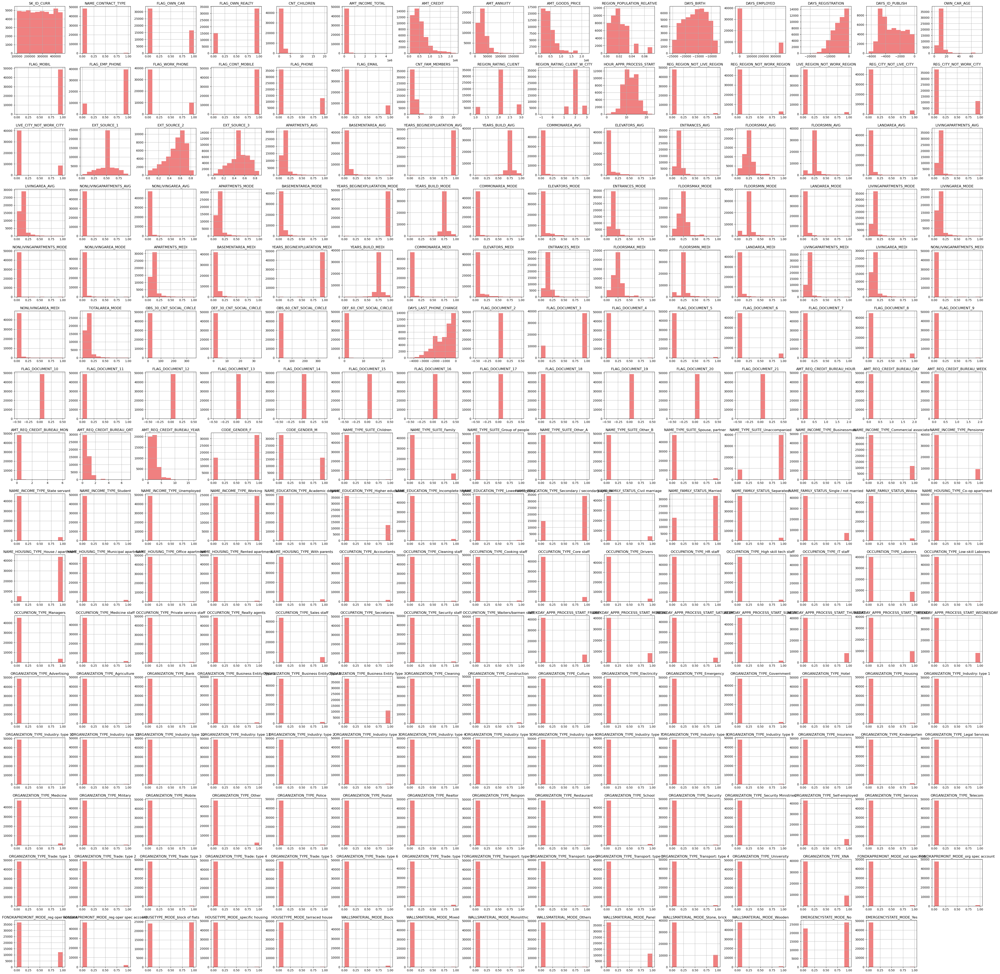

In [32]:
data_test.hist(figsize=(60,60))
plt.show()

<br/>

---
### Аутлаєри
---

Реалізуємо функцію для перегляду аутлаєрів:

In [33]:
def outliers(data):
    fig, axes = plt.subplots(nrows=len(data.columns), ncols=1)
    fig.set_size_inches(10, 70)
    for i, col in enumerate(data.columns):
        sns.boxplot(data=data[col], ax=axes[i], color='C1')
    plt.show()

<br/>
Переглянемо аутлаєри в обох датасетах:

#### TRAIN

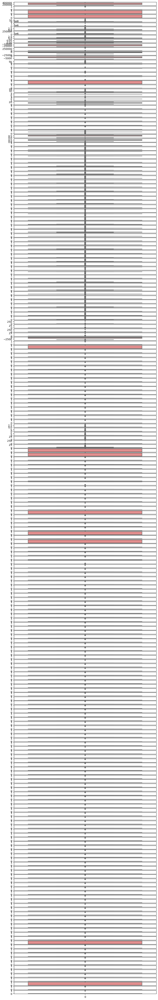

In [34]:
outliers(data_train)

<br/>

#### TEST

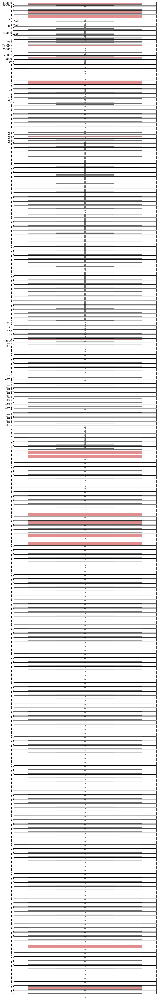

In [35]:
outliers(data_test)

<br/>

### Аналіз кореляцій між змінними

Важливо ідентифікувати змінні, які корелюють між собою, так як при кореляції зміни в одній змінній, як правило, асоціюються зі змінами в іншій змінній.

Реалізуємо функцію для виведення матриці кореляції:

In [36]:
def corr_matrix(data):
    correlation_matrix = data.corr()
    mask = np.array(correlation_matrix)
    mask[np.tril_indices_from(mask)] = False
    fig, ax = plt.subplots()
    fig.set_size_inches(250, 250)
    sns.heatmap(correlation_matrix, cmap="RdPu", mask=mask, vmax=0.8, square=True, annot=True)
    plt.show()

<br/>
Встановимо недопустиме значення коефіцієнту кореляції як 0.8 і вище та -0.8 і нижче та видалимо відповідні стовпці в обох датасетах:

In [37]:
max_corr = 0.8
correlation_matrix = data_train.corr().abs()

upper = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))
upper.head()

drop_columns = [column for column in upper.columns if any(upper[column] >= max_corr)]

data_train = data_train.drop(columns = drop_columns)
data_test = data_test.drop(columns = drop_columns)

<br/>
Визначимо новий розмір датасетів:

#### TRAIN

In [38]:
data_train.shape

(307511, 196)

#### TEST

In [39]:
data_test.shape

(48744, 195)

<br/>

Матриця кореляції набуде вигляду:

In [40]:
corr_matrix(data_train)

<br/>

---
### Реалізація класифікатора
---

<br/>
Розіб’ємо train датасет на частини для тренування та для валідації:

In [41]:
train = data_train.drop(columns = ['TARGET'])
train_x, test_x, train_y, test_y = train_test_split(train, data_train["TARGET"], test_size=0.2)

<br/>
Використаємо стандартизатор і трансформуємо дані в нормальний розподіл з середнім 0 і дисперсією 1:

In [42]:
sc = StandardScaler()

scaled_train_x = sc.fit_transform(train_x)
scaled_test_x = sc.transform(test_x)
scaled_test = sc.transform(data_test)

<br/>

#### Логістична регресія

In [43]:
lr = LogisticRegression(class_weight="balanced", max_iter=1000,tol=0.01)

lr.fit(scaled_train_x, train_y)
train_preds = lr.predict(scaled_train_x)
print(f"train ROC_AUC: {roc_auc_score(train_y, train_preds)}")

test_preds = lr.predict(scaled_test_x)
print(f"validation ROC_AUC: {roc_auc_score(test_y, test_preds)}")

train ROC_AUC: 0.6826173568550931
validation ROC_AUC: 0.6810756154750486


<br/>

Класифікуємо тестові дані та запишемо результат у csv файл:

In [44]:
pred = lr.predict_proba(scaled_test)[:, 1]

data_test = data_test.astype({"SK_ID_CURR": int})

res = pd.DataFrame({
    "SK_ID_CURR": data_test["SK_ID_CURR"],
    "TARGET": pred
})

res.sample(10)

,SK_ID_CURR,TARGET
16571,219632,0.685919
14877,207174,0.158320
4832,134880,0.499615
39069,388053,0.815142
40553,398473,0.284873
17776,228799,0.754925
31653,330193,0.258631
38802,385571,0.141018
17338,225721,0.140818
27402,299975,0.414519


In [45]:
res.to_csv('result.csv', index = False)

<br/>

### Результат

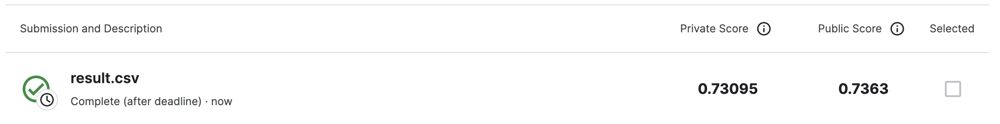

<br/>